In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import scipy.stats

import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import librosa.display
from IPython.display import Audio

from pathlib import Path
import sys
import os
import warnings
# suppress all warnings
warnings.filterwarnings("ignore")

In [2]:
class cfg:
    # random seed
    seed = 42

    # audio clip settings
    sr = 22050
    duration = 15 # the duration of the clips
    
    n_samples = duration*sr
    
    hop_length = 2048 # "stepsize" of the fft for the melspectrograms
    nfft = 4096 # windowsize of the fft for the melspectrograms
    n_mels = 128 # number of mel frequency bins
    fmax = sr/2 # maximum frequency in the melspectrograms
    input_dim = (n_mels, int(duration*sr//hop_length + 1))

## Compute audio features

In [3]:
#df = pd.read_csv("../../data/dataset10.csv")

In [4]:
#unique_species = sorted(df['en'].unique())

# Create a mapping from species to labels
#species_to_label = {species: idx for idx, species in enumerate(unique_species)}

# Map the species to labels and create the new column
#df['label'] = df['en'].map(species_to_label)

In [5]:
#df.head()

In [6]:
def compute_features(df, i):
    # Load audio file
    y, sr = librosa.load(df.loc[i, "fullfilename"])

    # Time-domain features
    df.loc[i, "zcr"] = np.mean(librosa.feature.zero_crossing_rate(y))
    df.loc[i, "rms"] = np.mean(librosa.feature.rms(y=y))

    # Frequency-domain features
    df.loc[i, "spectral_centroid"] = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))
    df.loc[i, "spectral_bandwidth"] = np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))
    df.loc[i, "spectral_contrast"] = np.mean(librosa.feature.spectral_contrast(y=y, sr=sr))
    df.loc[i, "spectral_flatness"] = np.mean(librosa.feature.spectral_flatness(y=y))
    df.loc[i, "spectral_rolloff"] = np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr))

    # Cepstral features
    mfccs = np.mean(librosa.feature.mfcc(y=y, sr=sr), axis=1)[:5]
    for j in range(5):
        df.loc[i, f"mfcc_{j+1}"] = mfccs[j]

    # Statistical features
    df.loc[i, "mean"] = np.mean(y)
    df.loc[i, "std_dev"] = np.std(y)
    df.loc[i, "skewness"] = scipy.stats.skew(y)
    df.loc[i, "kurtosis"] = scipy.stats.kurtosis(y)

In [9]:
feature_names = [
    'zcr',
    'rms',
    'spectral_centroid',
    'spectral_bandwidth',
    'spectral_contrast',
    'spectral_flatness',
    'spectral_rolloff',
    'mean',
    'std_dev',
    'skewness',
    'kurtosis'
] + [f'mfcc_{i+1}' for i in range(5)]
#for feature in feature_names:
    #df[feature] = float(-np.inf)

In [10]:
#for i in tqdm(df.index):
#    compute_features(df, i) 

In [11]:
#df.to_csv("../../data/dataset10_features.csv", index = False)
df = pd.read_csv("../../data/dataset10_features.csv")

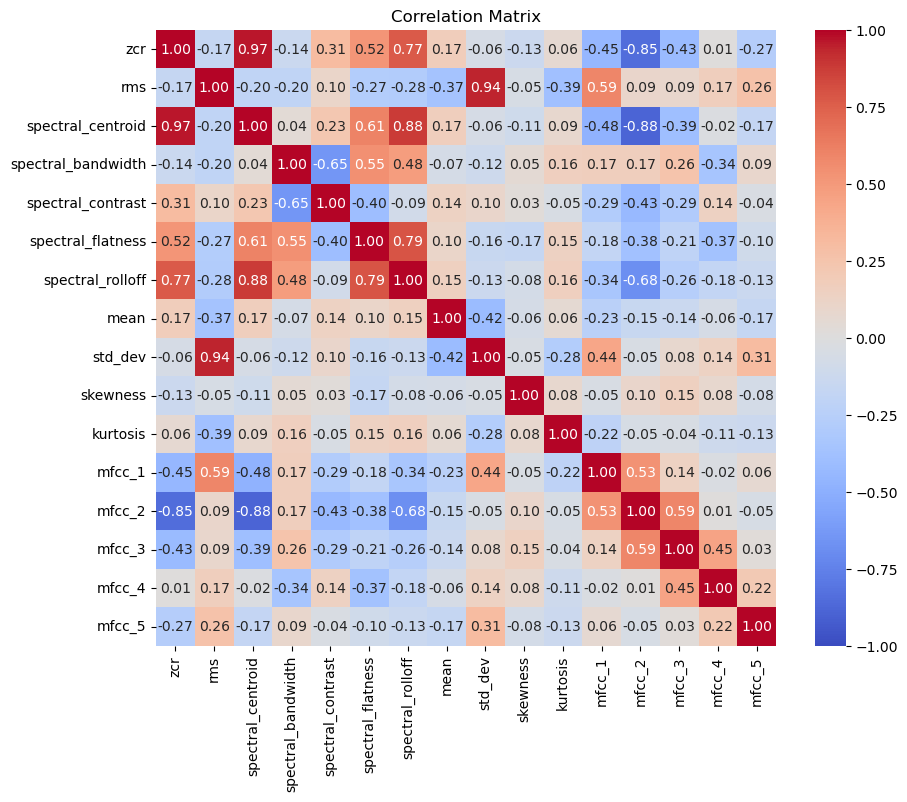

In [12]:
corr_matrix = df.loc[:100, feature_names].corr()

# Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

## Different scaling approaches

## No scaling

In [13]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from pandas.plotting import scatter_matrix

def evaluate_knn(df):
    scatter_matrix(df[feature_names], c=df.label, alpha=0.8, figsize=(30, 30), s=20);
    plt.show()
    df_train, df_test = train_test_split(df, test_size = 0.2, random_state = 42)
    print("# Neighbors \t Accuracy")
    for i in range(1,16):
        knn = KNeighborsClassifier(n_neighbors=i)
        knn.fit(df_train[feature_names], df_train.label)
        preds = knn.predict(df_test[feature_names])
        print(f"{i} \t\t {len(preds[preds == df_test.label])/len(preds)*100:.2f} %")

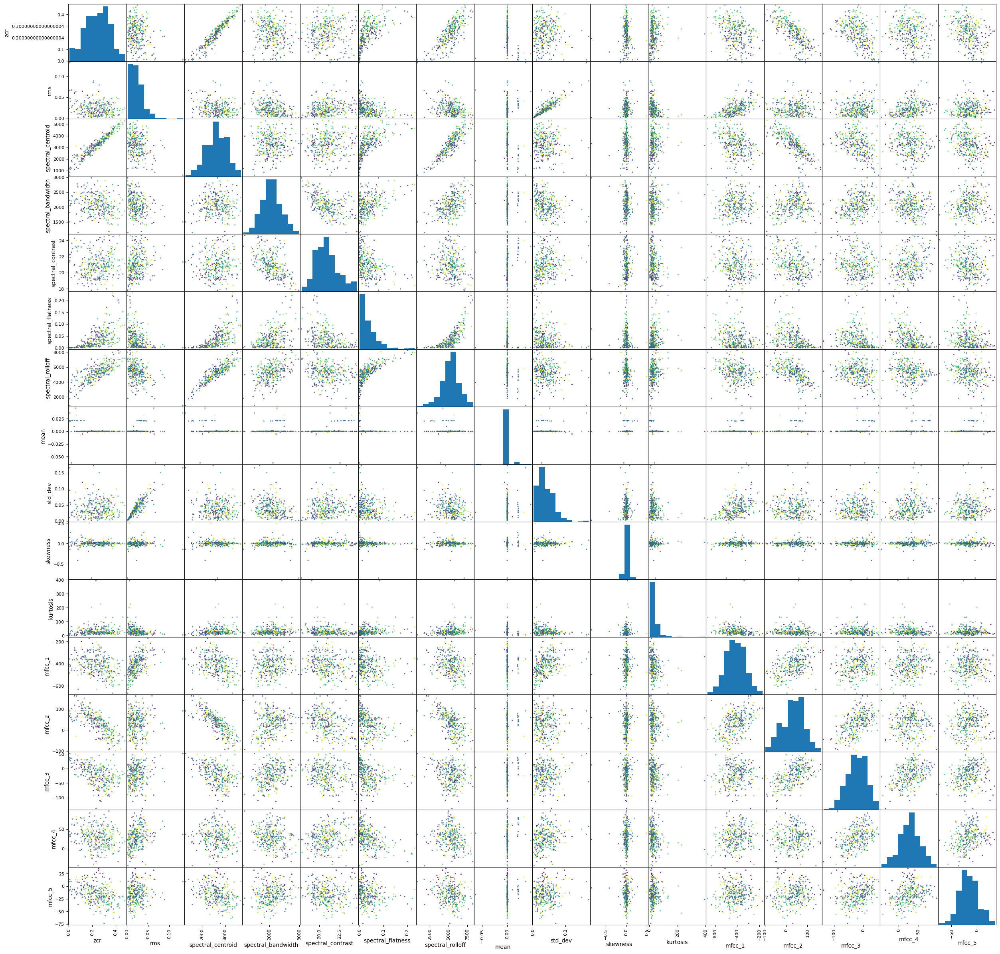

# Neighbors 	 Accuracy
1 		 6.67 %
2 		 8.33 %
3 		 6.67 %
4 		 15.00 %
5 		 13.33 %
6 		 13.33 %
7 		 16.67 %
8 		 15.00 %
9 		 13.33 %
10 		 11.67 %
11 		 13.33 %
12 		 10.00 %
13 		 10.00 %
14 		 13.33 %
15 		 11.67 %


In [14]:
evaluate_knn(df)

## With scaling

In [31]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import QuantileTransformer

### MinMaxScaler

In [16]:
minmax = MinMaxScaler()
df_minmax = df.copy()
df_minmax[feature_names] = pd.DataFrame(minmax.fit_transform(X = df_minmax[feature_names]), columns=feature_names)

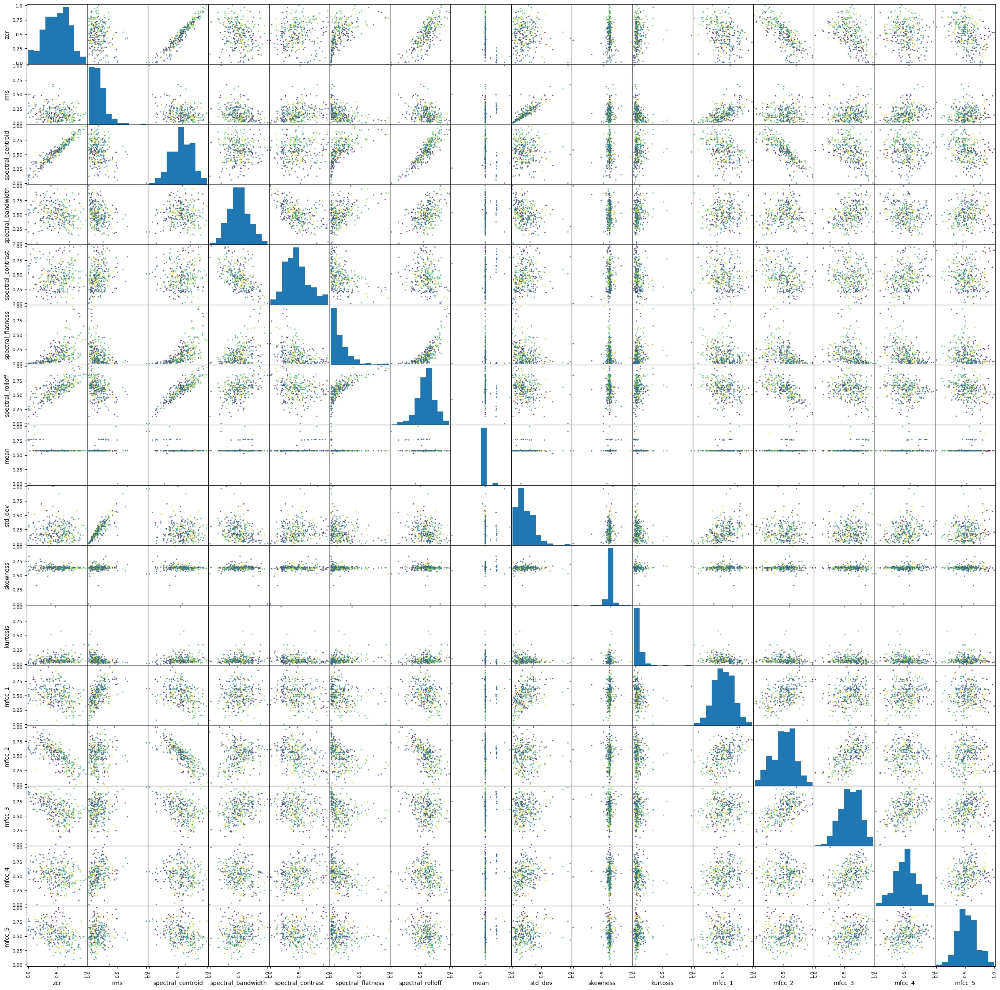

# Neighbors 	 Accuracy
1 		 26.67 %
2 		 23.33 %
3 		 26.67 %
4 		 20.00 %
5 		 18.33 %
6 		 21.67 %
7 		 23.33 %
8 		 26.67 %
9 		 30.00 %
10 		 28.33 %
11 		 28.33 %
12 		 26.67 %
13 		 21.67 %
14 		 23.33 %
15 		 21.67 %


In [17]:
evaluate_knn(df_minmax)

### StandardScaler

In [24]:
standard = StandardScaler()
df_std = df.copy()
df_std[feature_names] = pd.DataFrame(standard.fit_transform(X = df_std[feature_names]), columns=feature_names)

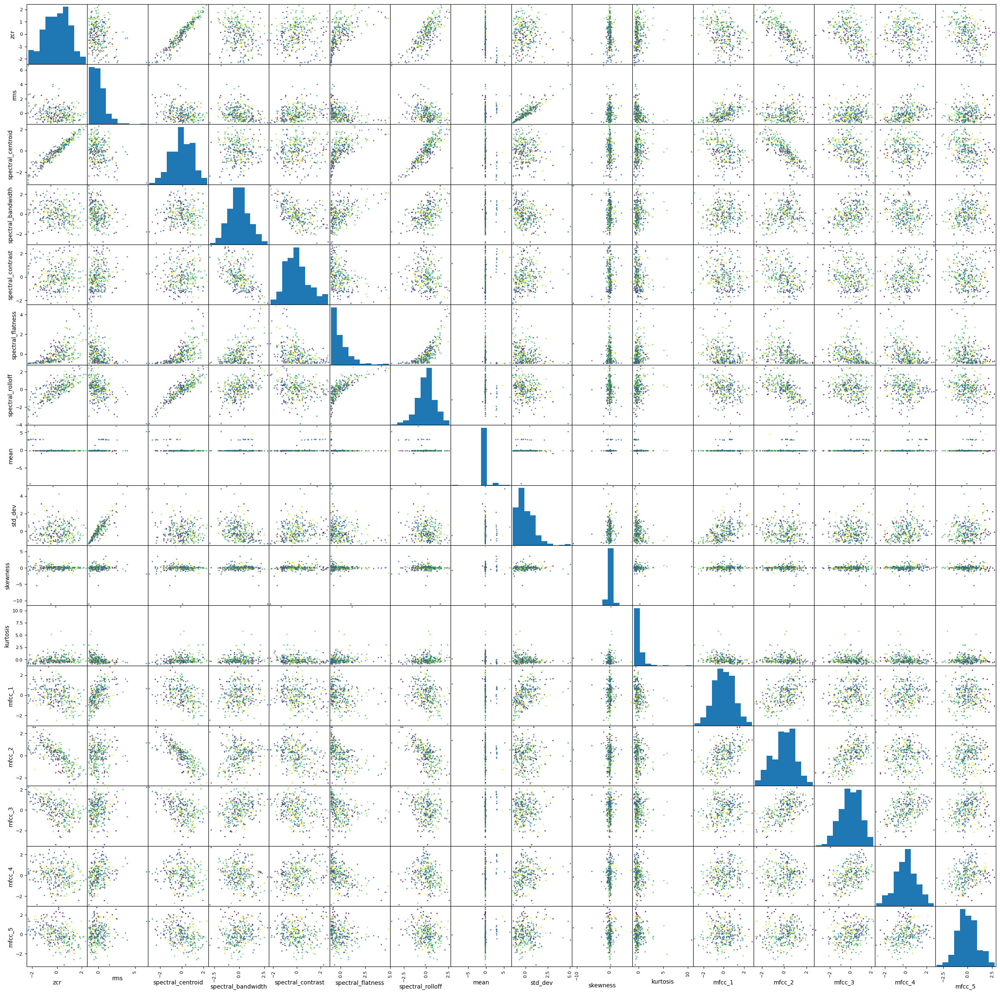

# Neighbors 	 Accuracy
1 		 35.00 %
2 		 25.00 %
3 		 25.00 %
4 		 23.33 %
5 		 21.67 %
6 		 25.00 %
7 		 28.33 %
8 		 21.67 %
9 		 20.00 %
10 		 18.33 %
11 		 23.33 %
12 		 21.67 %
13 		 21.67 %
14 		 25.00 %
15 		 23.33 %


In [25]:
evaluate_knn(df_std)

### RobustScaler

In [26]:
robust = RobustScaler()
df_robust = df.copy()
df_robust[feature_names] = pd.DataFrame(robust.fit_transform(X = df_robust[feature_names]), columns=feature_names)

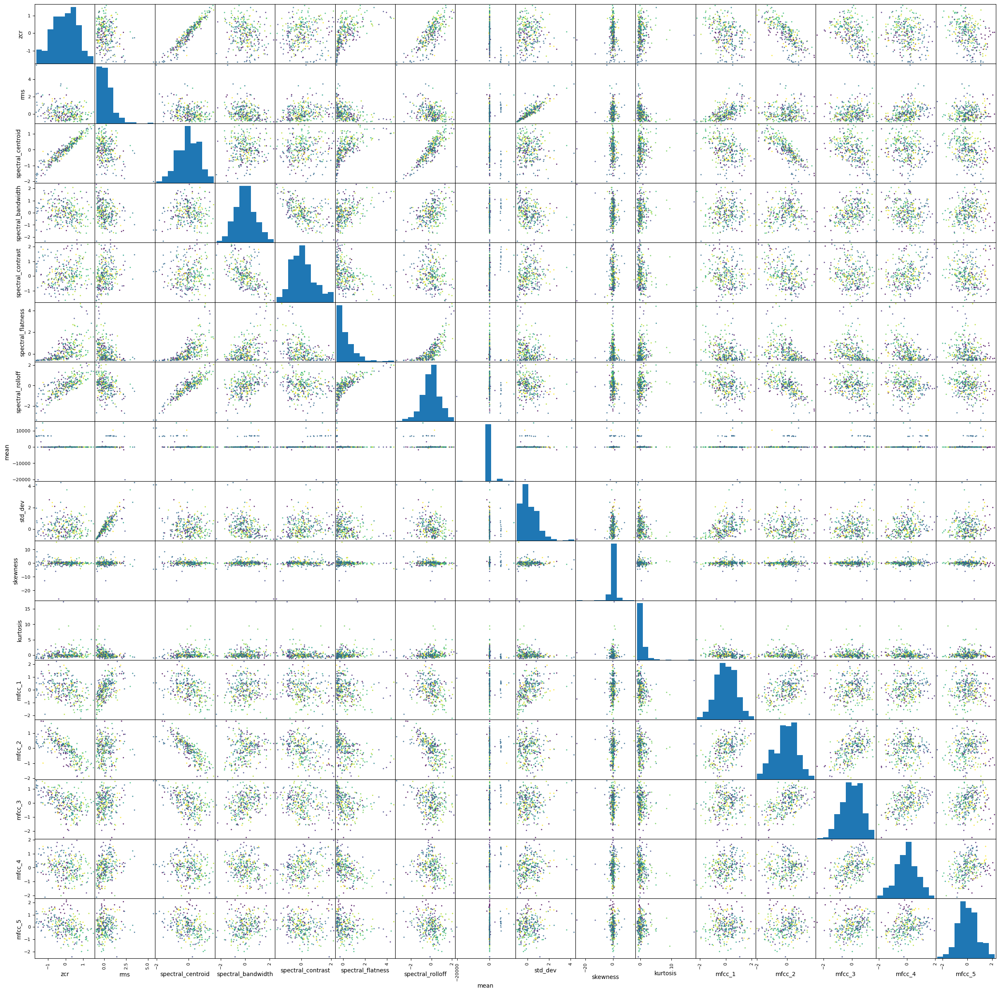

# Neighbors 	 Accuracy
1 		 33.33 %
2 		 20.00 %
3 		 20.00 %
4 		 21.67 %
5 		 28.33 %
6 		 25.00 %
7 		 23.33 %
8 		 26.67 %
9 		 25.00 %
10 		 25.00 %
11 		 28.33 %
12 		 28.33 %
13 		 28.33 %
14 		 26.67 %
15 		 25.00 %


In [27]:
evaluate_knn(df_robust)

### Normalizer

In [28]:
normalizer = Normalizer()
df_norm = df.copy()
df_norm[feature_names] = pd.DataFrame(normalizer.fit_transform(X = df_norm[feature_names]), columns=feature_names)

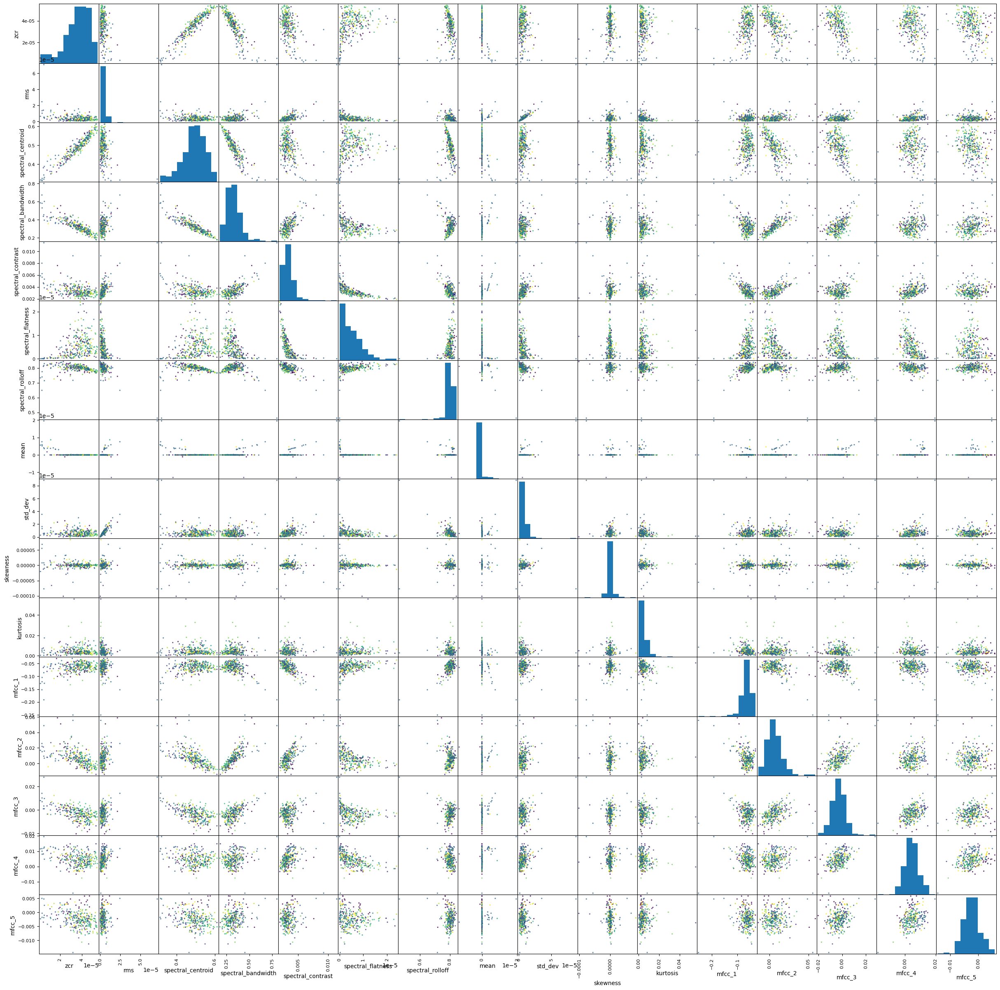

# Neighbors 	 Accuracy
1 		 13.33 %
2 		 15.00 %
3 		 13.33 %
4 		 18.33 %
5 		 20.00 %
6 		 20.00 %
7 		 16.67 %
8 		 15.00 %
9 		 18.33 %
10 		 20.00 %
11 		 21.67 %
12 		 21.67 %
13 		 21.67 %
14 		 16.67 %
15 		 18.33 %


In [29]:
evaluate_knn(df_norm)

### QuantileTransformer

In [32]:
quant = QuantileTransformer(output_distribution='normal')
df_quant = df.copy()
df_quant[feature_names] = pd.DataFrame(quant.fit_transform(X = df_quant[feature_names]), columns=feature_names)

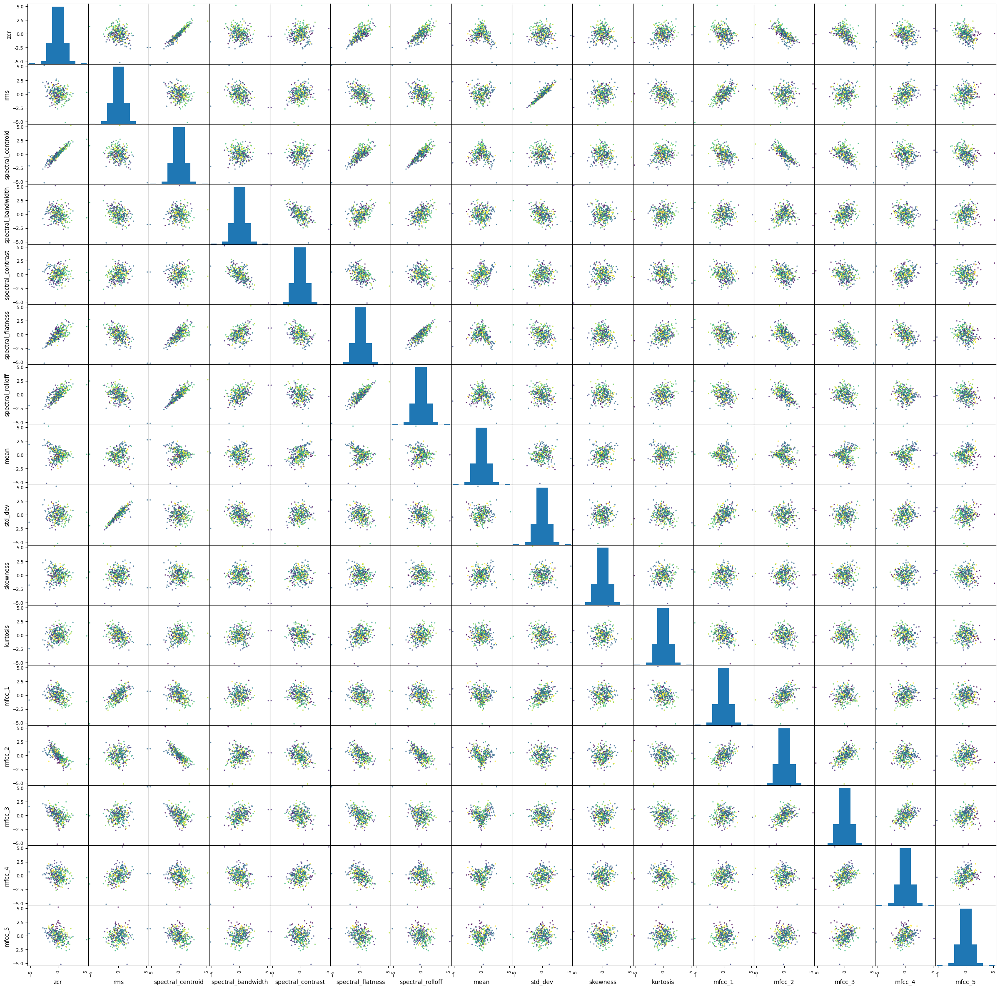

# Neighbors 	 Accuracy
1 		 33.33 %
2 		 21.67 %
3 		 23.33 %
4 		 25.00 %
5 		 23.33 %
6 		 21.67 %
7 		 20.00 %
8 		 18.33 %
9 		 20.00 %
10 		 21.67 %
11 		 21.67 %
12 		 20.00 %
13 		 18.33 %
14 		 16.67 %
15 		 20.00 %


In [33]:
evaluate_knn(df_quant)

## Principal Component Analysis

In [38]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)  # Retain 95% of the variance
principal_components = pca.fit_transform(df_std[feature_names])

(300, 10)


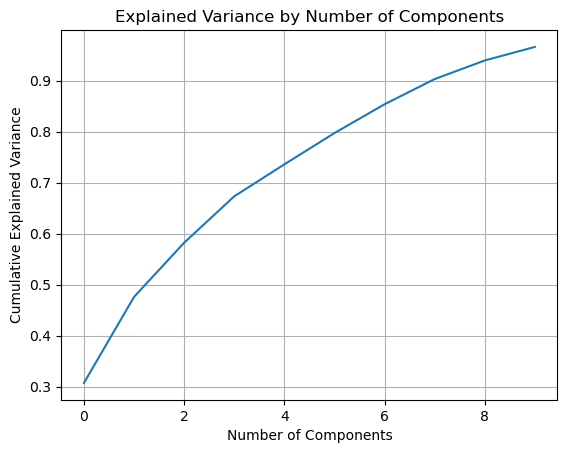

In [42]:
# Check the shape of the transformed data
print(principal_components.shape)

# Plot the explained variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of Components')
plt.grid()
plt.show()

In [43]:
def evaluate_pca(pca):
    scatter_matrix(pca, c=df.label, alpha=0.8, figsize=(30, 30), s=20);
    plt.show()
    X_train, X_test, y_train, y_test = train_test_split(pca, df.label, test_size=0.2, random_state=42)
    print("# Neighbors \t Accuracy")
    for i in range(1,16):
        knn = KNeighborsClassifier(n_neighbors=i)
        knn.fit(X_train, y_train)
        preds = knn.predict(X_test)
        print(f"{i} \t\t {len(preds[preds == y_test])/len(preds)*100:.2f} %")

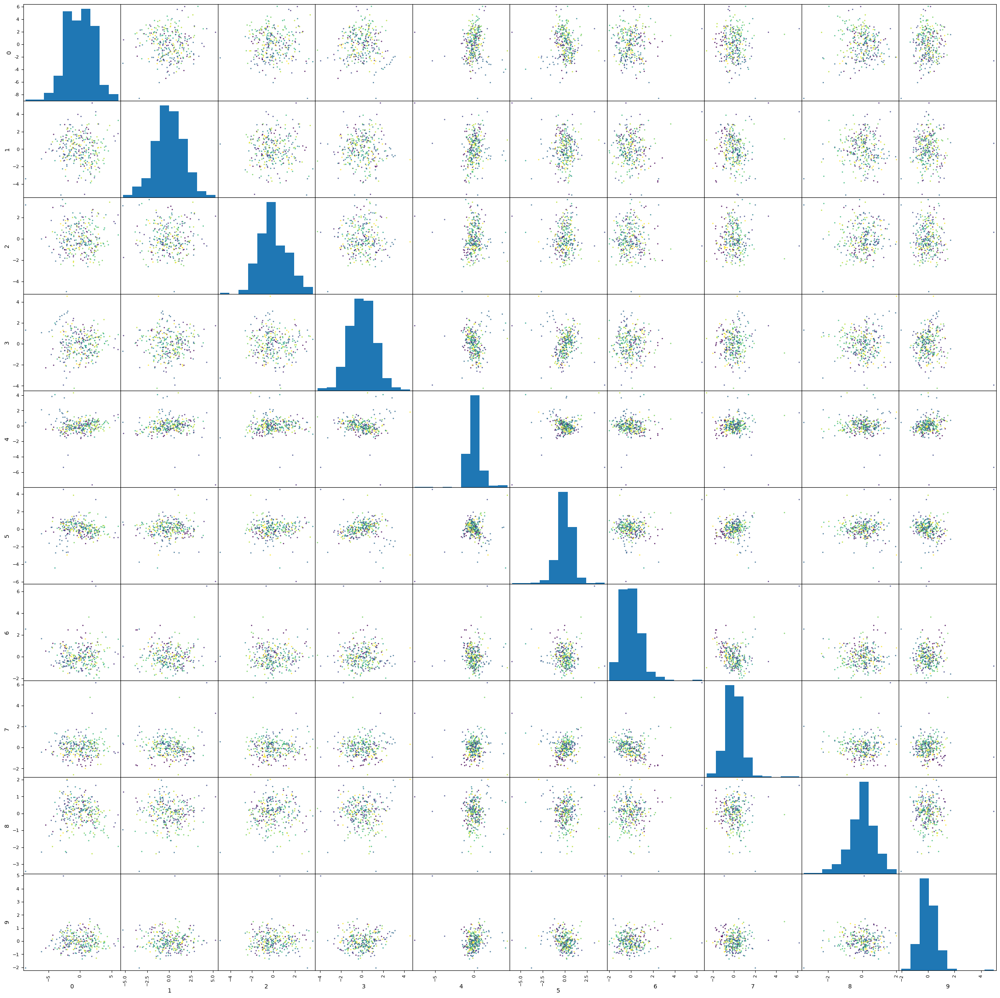

# Neighbors 	 Accuracy
1 		 36.67 %
2 		 23.33 %
3 		 30.00 %
4 		 23.33 %
5 		 18.33 %
6 		 21.67 %
7 		 26.67 %
8 		 23.33 %
9 		 18.33 %
10 		 16.67 %
11 		 20.00 %
12 		 20.00 %
13 		 23.33 %
14 		 18.33 %
15 		 20.00 %


In [46]:
df_pca = pd.DataFrame(principal_components)
evaluate_pca(df_pca)